In [10]:
import torch
from torch import nn
import torch.nn.functional as F
import torchvision
import torchvision.transforms as transforms
import numpy as np
import os

import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, precision_recall_fscore_support
import scipy.ndimage
from scipy import misc
from glob import glob
from scipy import stats
from sklearn.preprocessing import LabelEncoder, StandardScaler
import skimage
import imageio
import seaborn as sns
from PIL import Image
import glob
import matplotlib.pyplot as plt
import matplotlib
%matplotlib inline

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
device

device(type='cpu')

In [11]:
# importing metadata and checking for its shape
data_dir = os.getcwd()
metadata = pd.read_csv(data_dir + '/metadata.csv')
print(metadata.shape)

# label encoding the seven classes for skin cancers

le = LabelEncoder()
le.fit(metadata['TumorType'])
LabelEncoder()
print("Classes:", list(le.classes_))

metadata['label'] = le.transform(metadata["TumorType"])
metadata.sample(10)

(2081, 7)
Classes: ['A', 'DC', 'F', 'LC', 'MC', 'PC', 'PT', 'TA']


,BiopsyProcedure,TumorClass,TumorType,Year,SlideID,Magnification,Sequence,label
1448,SOB,M,DC,14,5694,100,11,1
11,SOB,B,A,14,22549AB,100,12,0
1930,SOB,M,MC,14,19979C,100,6,4
399,SOB,B,PT,14,21998AB,100,27,6
1189,SOB,M,DC,14,20629,100,1,1
376,SOB,B,PT,14,21998AB,100,4,6
955,SOB,M,DC,14,15696,100,17,1
1997,SOB,M,PC,14,15704,100,22,5
361,SOB,B,F,14,9133,100,25,2
773,SOB,M,DC,14,13412,100,11,1


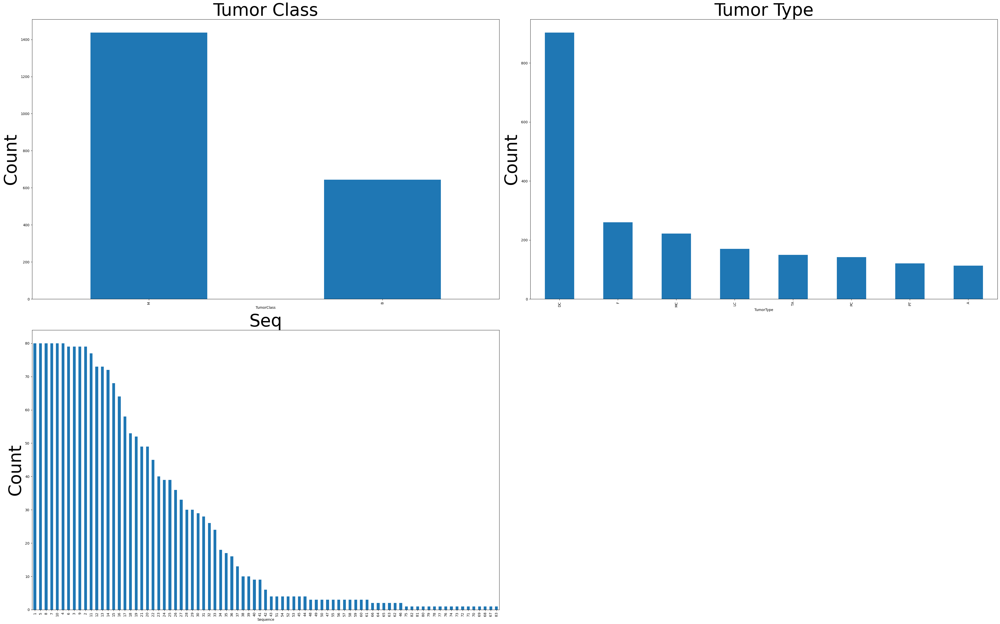

In [12]:
# Getting a sense of what the distribution of each column looks like

fig = plt.figure(figsize=(40,25))

ax1 = fig.add_subplot(221)
metadata['TumorClass'].value_counts().plot(kind='bar', ax=ax1)
ax1.set_ylabel('Count', size=50)
ax1.set_title('Tumor Class', size = 50)

ax2 = fig.add_subplot(222)
metadata['TumorType'].value_counts().plot(kind='bar', ax=ax2)
ax2.set_ylabel('Count', size=50)
ax2.set_title('Tumor Type', size=50);

ax3 = fig.add_subplot(223)
metadata['Sequence'].value_counts().plot(kind='bar')
ax3.set_ylabel('Count', size=50)
ax3.set_title('Seq', size=50)


plt.tight_layout()
plt.show()

In [13]:
import os
import csv

# Specify the directory containing the images
directory_path = 'benign_malignant_dataset'

# Specify the output CSV file
output_csv_path = 'metadata.csv'

# Column headers for the CSV file
headers = ['BiopsyProcedure', 'TumorClass', 'TumorType', 'Year', 'SlideID', 'Magnification', 'Sequence']

# Prepare to write to the CSV file
with open(output_csv_path, 'w', newline='') as csvfile:
    writer = csv.writer(csvfile)
    writer.writerow(headers)

    # Iterate over each file in the directory
    for filename in os.listdir(directory_path):
        if filename.endswith(".jpg") or filename.endswith(".png"):  # Check file extension
            parts = filename.split('-')
            biopsy_proc_tumor = parts[0].split('_')

            # Extract each component
            biopsy_procedure = biopsy_proc_tumor[0]
            tumor_class = biopsy_proc_tumor[1]
            tumor_type = biopsy_proc_tumor[2]
            year = parts[1]
            slide_id = parts[2]
            magnification = parts[3]
            sequence = parts[4].split('.')[0]  # Remove file extension

            # Write the data row to the CSV file
            writer.writerow([biopsy_procedure, tumor_class, tumor_type, year, slide_id, magnification, sequence])

print("Metadata CSV file has been created successfully.")

Metadata CSV file has been created successfully.


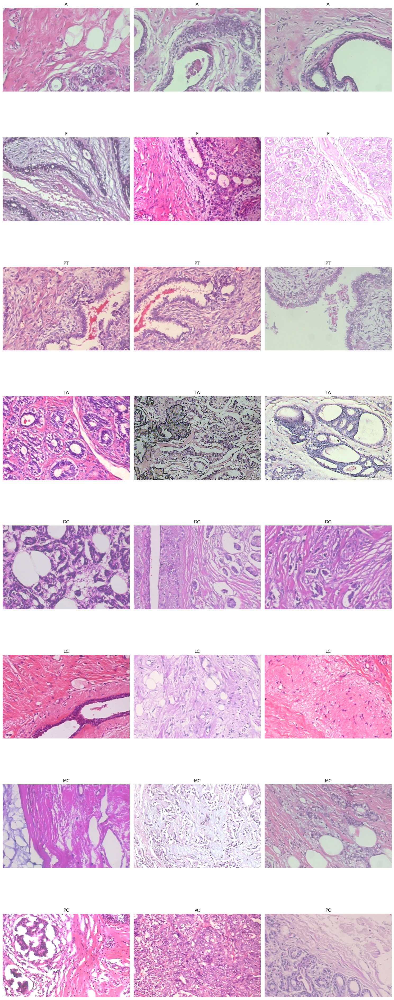

In [20]:
import os
from PIL import Image
import matplotlib.pyplot as plt

# Assuming 'metadata' DataFrame and 'directory_path' are defined as before

# Display three images for each unique class
unique_classes = metadata['TumorType'].unique()

# Set up matplotlib figures
fig, axs = plt.subplots(len(unique_classes), 3, figsize=(15, len(unique_classes) * 5))

# If there's only one class, axs may not be a 2D array, handle this case:
if len(unique_classes) == 1:
    axs = [axs]

directory_path = 'benign_malignant_dataset'
for idx, tumor_type in enumerate(unique_classes):
    # Filter metadata for the current class
    class_metadata = metadata[metadata['TumorType'] == tumor_type]

    # Sample three images from this class, if available
    sampled_metadata = class_metadata.sample(n=min(3, len(class_metadata)), random_state=42)

    for col, (_, row) in enumerate(sampled_metadata.iterrows()):
        sequence_number = str(row['Sequence']).zfill(3)
        # Construct image path
        image_path = os.path.join(directory_path, f"{row['BiopsyProcedure']}_{row['TumorClass']}_{row['TumorType']}-{row['Year']}-{row['SlideID']}-{row['Magnification']}-{sequence_number}.png")

        # Load image
        image = Image.open(image_path)

        # Show image
        axs[idx, col].imshow(image)
        axs[idx, col].axis('off')  # Hide axes
        axs[idx, col].set_title(f"{tumor_type}")

plt.tight_layout()
plt.show()

In [28]:
import os
import shutil

# Define your source and destination directories
data_dir = "benign_malignant_dataset"  # Update this path to your source directory
base_dest_dir = os.getcwd()  # Update this path to your base destination directory
dest_dir = os.path.join(base_dest_dir, "classes")  # Creates a new 'classes' subfolder

# Create a dictionary to map tumor types to their respective folder names
tumor_types = {
    "A": "Adenosis",
    "F": "Fibroadenoma",
    "PT": "Phyllodes_Tumor",
    "TA": "Tubular_Adenoma",
    "DC": "Ductal_Carcinoma",
    "LC": "Lobular_Carcinoma",
    "MC": "Mucinous_Carcinoma",
    "PC": "Papillary_Carcinoma"
}

# Create the 'classes' directory if it does not exist
os.makedirs(dest_dir, exist_ok=True)

# Create the directories for each tumor type within 'classes' if they do not exist
for folder in tumor_types.values():
    os.makedirs(os.path.join(dest_dir, folder), exist_ok=True)

# Process each file in the dataset directory
for filename in os.listdir(data_dir):
    if filename.endswith(".png"):  # Change to your file extension if different
        parts = filename.split('_')
        if len(parts) > 2:  # Ensure the filename can be split correctly
            tumor_class = parts[2].split('-')[0]  # Correctly parse the tumor class from the filename
            folder_name = tumor_types.get(tumor_class)

            if folder_name:
                src_path = os.path.join(data_dir, filename)
                dest_path = os.path.join(dest_dir, folder_name, filename)
                shutil.copy(src_path, dest_path)
                print(f"Copied {filename} to {folder_name}/")
            else:
                print(f"No matching folder for {filename} based on tumor class {tumor_class}")
        else:
            print(f"Filename format error: {filename}")
    else:
        print(f"Skipped non-image file: {filename}")

print("Finished processing images.")

Copied SOB_B_A-14-22549AB-100-001.png to Adenosis/
Copied SOB_B_A-14-22549AB-100-002.png to Adenosis/
Copied SOB_B_A-14-22549AB-100-003.png to Adenosis/
Copied SOB_B_A-14-22549AB-100-004.png to Adenosis/
Copied SOB_B_A-14-22549AB-100-005.png to Adenosis/
Copied SOB_B_A-14-22549AB-100-006.png to Adenosis/
Copied SOB_B_A-14-22549AB-100-007.png to Adenosis/
Copied SOB_B_A-14-22549AB-100-008.png to Adenosis/
Copied SOB_B_A-14-22549AB-100-009.png to Adenosis/
Copied SOB_B_A-14-22549AB-100-010.png to Adenosis/
Copied SOB_B_A-14-22549AB-100-011.png to Adenosis/
Copied SOB_B_A-14-22549AB-100-012.png to Adenosis/
Copied SOB_B_A-14-22549AB-100-013.png to Adenosis/
Copied SOB_B_A-14-22549AB-100-014.png to Adenosis/
Copied SOB_B_A-14-22549AB-100-015.png to Adenosis/
Copied SOB_B_A-14-22549AB-100-016.png to Adenosis/
Copied SOB_B_A-14-22549AB-100-017.png to Adenosis/
Copied SOB_B_A-14-22549AB-100-018.png to Adenosis/
Copied SOB_B_A-14-22549AB-100-019.png to Adenosis/
Copied SOB_B_A-14-22549AB-100-0

In [32]:
import numpy as np

label = [ 'DC', 'F', 'MC', 'LC', 'TA', 'PC', 'PT', 'A' ]

def estimate_weights_mfb(label):
    class_weights = np.zeros_like(label, dtype=float)
    counts = np.zeros_like(label)
    for i,l in enumerate(label):
        counts[i] = metadata[metadata['TumorType']==str(l)]['TumorType'].value_counts()[0]
    counts = counts.astype(float)
    median_freq = np.median(counts)
    for i, label in enumerate(label):
        #print(label)
        class_weights[i] = median_freq / counts[i]
    return class_weights

classweight= estimate_weights_mfb(label)

for i in range(len(label)):
    print(label[i],":", classweight[i])


DC : 0.17777777777777778
F : 0.6153846153846154
MC : 0.7272727272727273
LC : 0.9411764705882353
TA : 1.0666666666666667
PC : 1.1428571428571428
PT : 1.3333333333333333
A : 1.4545454545454546


In [38]:
norm_mean = (0.485, 0.456, 0.406)
norm_std = (0.229, 0.224, 0.225)

batch_size = 10
validation_batch_size = 10
test_batch_size = 10

# We compute the weights of individual classes and convert them to tensors
class_weights = estimate_weights_mfb(label)
class_weights = torch.FloatTensor(class_weights)

transform_train = transforms.Compose([
                    transforms.Resize((224,224)),
                    transforms.RandomHorizontalFlip(),
                    transforms.RandomRotation(degrees=60),
                    transforms.ToTensor(),
                    transforms.Normalize(norm_mean, norm_std),
                    ])

transform_test = transforms.Compose([
                    transforms.Resize((224,224)),
                    transforms.ToTensor(),
                    transforms.Normalize(norm_mean, norm_std),
                    ])


In [39]:
import pandas as pd
import numpy as np
from sklearn.model_selection import StratifiedShuffleSplit
from torch.utils.data import DataLoader, Subset, SubsetRandomSampler
from torchvision.datasets import ImageFolder
import torchvision.transforms as transforms

# Assuming 'metadata' DataFrame is loaded and preprocessed
data_dir = 'classes'  # Adjust this path to your dataset location

# Load your dataset with ImageFolder or any appropriate loader that suits your dataset structure
dataset = ImageFolder(root=data_dir, transform=transforms.ToTensor())  # Update transform as necessary

# Extract labels from the dataset
data_labels = [x[1] for x in dataset.samples]

# Define the splits: 64% Train, 20% Test, 16% Validation
train_size = 0.64
test_size = 0.20
val_size = 0.16

# Create StratifiedShuffleSplit instance
splitter = StratifiedShuffleSplit(n_splits=1, test_size=test_size + val_size)

# Generate train and temp indices (temp = test + validation)
for train_idx, temp_idx in splitter.split(np.zeros(len(data_labels)), data_labels):
    train_labels = [data_labels[i] for i in train_idx]
    temp_labels = [data_labels[i] for i in temp_idx]

# Create another StratifiedShuffleSplit to split temp into test and validation
temp_splitter = StratifiedShuffleSplit(n_splits=1, test_size=val_size / (test_size + val_size))

for val_idx, test_idx in temp_splitter.split(np.zeros(len(temp_labels)), temp_labels):
    validation_idx = temp_idx[val_idx]
    test_idx = temp_idx[test_idx]

# Convert these indices into subsets
train_dataset = Subset(dataset, train_idx)
validation_dataset = Subset(dataset, validation_idx)
test_dataset = Subset(dataset, test_idx)

# You can now use these datasets directly in your DataLoader
from torch.utils.data import DataLoader

train_loader = DataLoader(train_dataset, batch_size=10, shuffle=True)
validation_loader = DataLoader(validation_dataset, batch_size=10, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=10, shuffle=False)

# Now you can proceed to train your model using these loaders
print(f"Train set size: {len(train_loader.dataset)}")
print(f"Validation set size: {len(validation_loader.dataset)}")
print(f"Test set size: {len(test_loader.dataset)}")


Train set size: 1331
Validation set size: 416
Test set size: 334


In [40]:
train_dataset = ImageFolder(root=data_dir, transform=transform_train)
train_sampler = SubsetRandomSampler(train_idx)
train_data_loader = DataLoader(train_dataset, batch_size=batch_size, sampler=train_sampler, num_workers=1, pin_memory=True)

# Validation dataset
validation_dataset = ImageFolder(root=data_dir, transform=transform_train)
validation_sampler = SubsetRandomSampler(val_idx)
validation_data_loader = DataLoader(validation_dataset, batch_size=validation_batch_size, sampler=validation_sampler, num_workers=1, pin_memory=True)

# Test dataset
test_dataset = ImageFolder(root=data_dir, transform=transform_test)
test_sampler = SubsetRandomSampler(test_idx)
test_data_loader = DataLoader(test_dataset, batch_size=test_batch_size, sampler=test_sampler, num_workers=1, pin_memory=True)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Fibroadenoma,  Fibroadenoma,  Phyllodes Tumor,  Fibroadenoma,  Adenosis,  Papillary Carcinoma,  Fibroadenoma,  Phyllodes Tumor,  Fibroadenoma,  Fibroadenoma, 


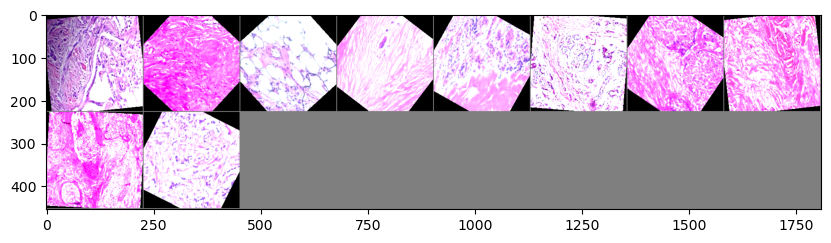

In [43]:
classes = [ 'Adenosis', 'Fibroadenoma', 'Tubular Adenoma', 'Phyllodes Tumor', 'Ductal Carcinoma', 'Lobular Carcinoma', 'Mucinous Carcinoma', 'Papillary Carcinoma']
# functions to show an image
fig = plt.figure(figsize=(10, 15))
def imshow(img):
    # Denormalize the image (adjust based on your normalization)
    img = img / 2 + .5
    # Convert the PyTorch tensor to a NumPy array
    npimg = img.numpy()
    # Transpose the image tensor from (C, H, W) to (H, W, C)
    plt.imshow(np.transpose(npimg, (1, 2, 0)))


# get some random training images
dataiter = iter(train_data_loader)
images, labels = next(dataiter)

# show images
imshow(torchvision.utils.make_grid(images))
# print labels
print(' '.join('%5s, ' % classes[labels[j]] for j in range(len(labels))))